In [1]:
# Importing neccessary libraies

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
# import waterfall_chart
import re
# from pandas_profiling import ProfileReport

import warnings
warnings.filterwarnings('ignore')

# Importing libraries for Modeling
from sklearn.metrics import mean_squared_log_error, mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import *
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score
import plotly.express as px

## Overview

## Questions
1. Which location emplyess more?
2. Which profession takes the most salaries?
3. Which location has the most employees?
4. Which year has the most employees?
5. Which level of expectise is hired the most?
## Hypothesis
1. Salaries increase as the year passes by.
2. Location determines how large your salary is.
3. Experience level determines how large your salary is.
4. Larger companies pay higher salaries.

In [2]:
# Loading the dataset
df = pd.read_csv('ds_salaries.csv')
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


In [4]:
# Dropping columns
df.drop(['salary_currency','salary_in_usd'], axis=1 , inplace=True)

## Employment type and Experience level distribution.

Text(0, 0.5, '')

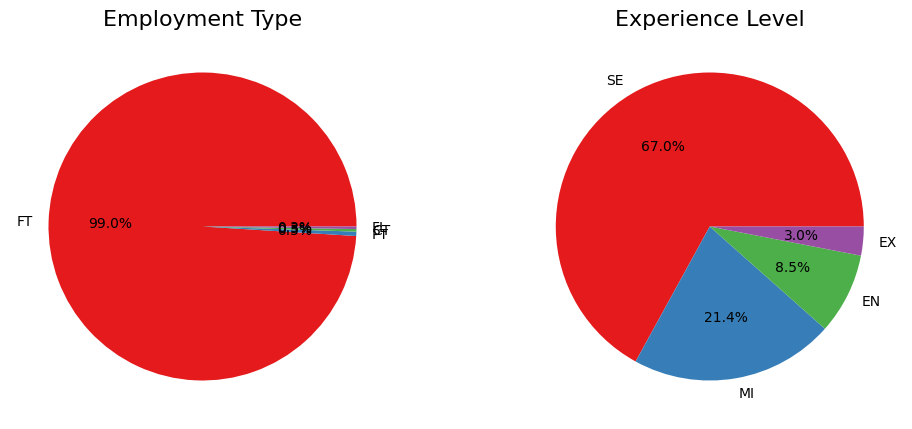

In [5]:
plt.figure(figsize=(12, 5))
sns.set_palette('Set1')

# job types
plt.subplot(1,2,1)
ax = df['employment_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
ax.set_title('Employment Type', fontdict={'fontsize': 16})
ax.set_ylabel('')

# experience levels
plt.subplot(1,2,2)
ax = df['experience_level'].value_counts().plot(kind='pie', autopct='%1.1f%%')
ax.set_title('Experience Level', fontdict={'fontsize': 16})
ax.set_ylabel('')

## Which year employed the most workers?

In [6]:
df.work_year.value_counts()

work_year
2023    1785
2022    1664
2021     230
2020      76
Name: count, dtype: int64

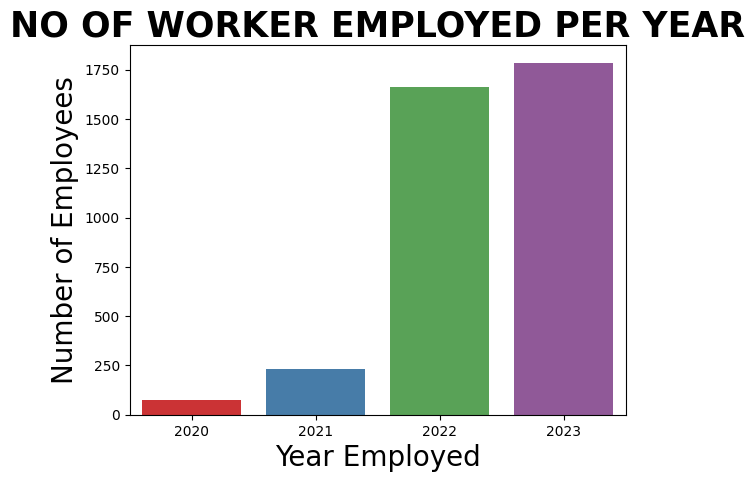

In [7]:
# Plotting the the number of employees employed in each given year.
ax=sns.countplot(x='work_year', data = df)
plt.xlabel('Year Employed', fontsize=20)
plt.ylabel('Number of Employees', fontsize=20)
plt.title('NO OF WORKER EMPLOYED PER YEAR', fontsize=25, fontweight='bold')
# plt.xticks(rotation='horizontal')
# sns.set(style='darkgrid')
plt.show()

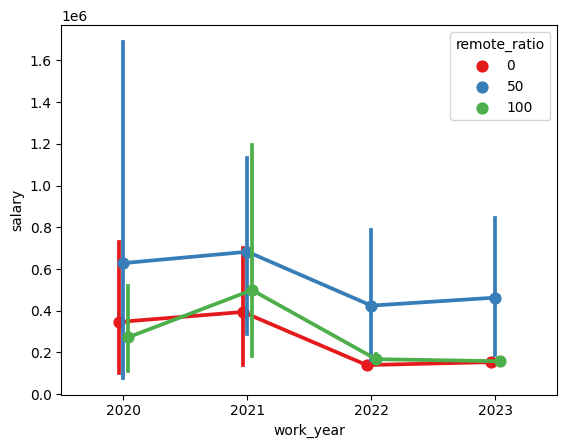

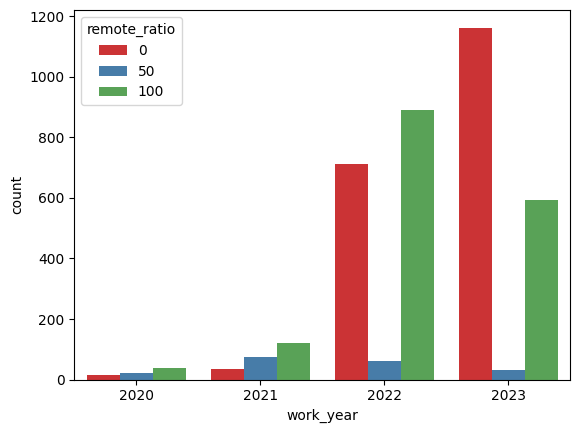

In [8]:
# Defining the Visualization parameters.

# plt.figure(figsize=(10,5))

plt.subplots(1,1)

ax= sns.pointplot(x='work_year', 
                  y='salary', 
                  hue='remote_ratio',
                  dodge=True,
                  data=df)
plt.show()

plt.subplots(1,1)

ax=sns.countplot(x='work_year', 
                 hue='remote_ratio',
#                  ax = axes[1,1],
                 data=df)
plt.show()

## Which experience level was employed the most?

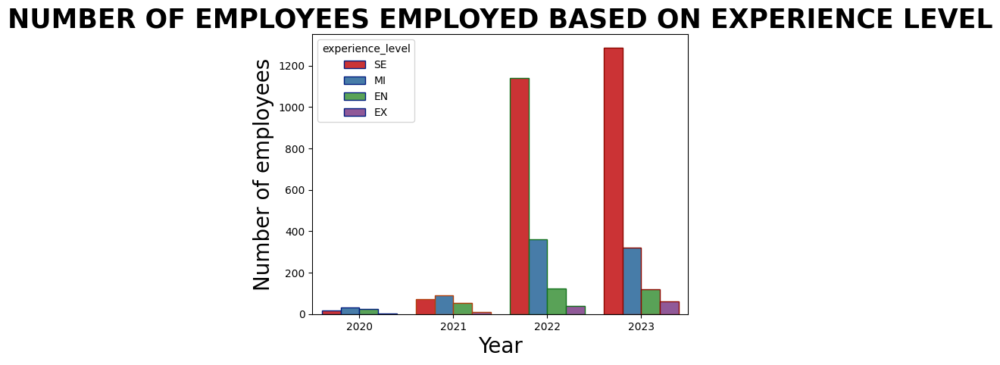

In [9]:
# Plotting
ax=sns.countplot(x='work_year', hue='experience_level', data=df, edgecolor=sns.color_palette('dark',9))
plt.title('NUMBER OF EMPLOYEES EMPLOYED BASED ON EXPERIENCE LEVEL', fontsize=25, fontweight='bold')
plt.xlabel('Year', fontsize=20)
plt.ylabel('Number of employees', fontsize=20)
plt.show()

## Which residence has the most employees?

In [10]:
employee_residence = pd.DataFrame(df.employee_residence.value_counts()[:15])
employee_residence

,count
employee_residence,
US,3004
GB,167
CA,85
ES,80
IN,71
DE,48
FR,38
PT,18
BR,18


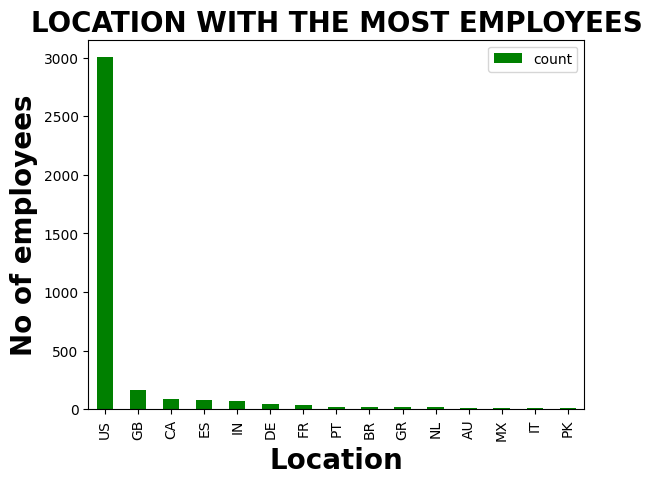

In [11]:
# Residence with the most employees 

employee_residence.plot(kind = 'bar', color = 'green')
plt.title('LOCATION WITH THE MOST EMPLOYEES', fontsize = 20, fontweight = 'bold')
plt.xlabel('Location', fontsize = 20,fontweight = 'bold')
plt.ylabel('No of employees', fontsize = 20, fontweight = 'bold')
plt.rcParams['figure.figsize'] = (10,8)
plt.savefig('employee residence.png', dpi = 300)

### Which Job title was employed the most .

In [12]:
job_title = pd.DataFrame(df.job_title.value_counts()[:20])
job_title

,count
job_title,
Data Engineer,1040
Data Scientist,840
Data Analyst,612
Machine Learning Engineer,289
Analytics Engineer,103
Data Architect,101
Research Scientist,82
Data Science Manager,58
Applied Scientist,58


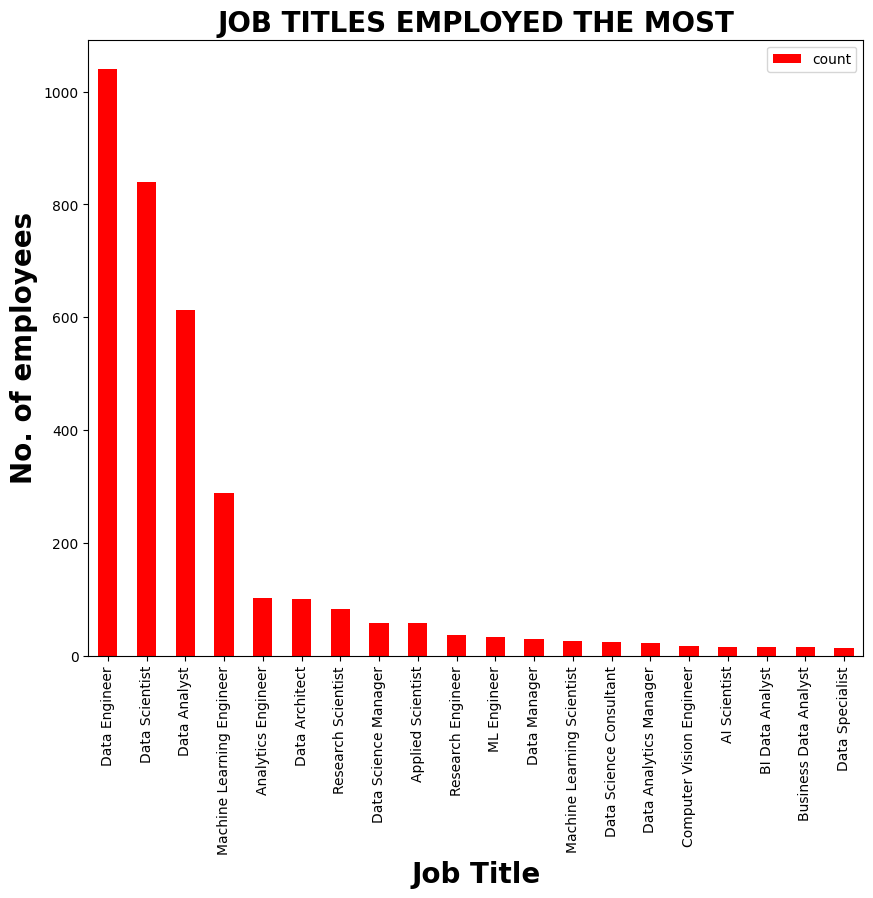

In [13]:
job_title.plot(kind = 'bar', color = 'red')
plt.title('JOB TITLES EMPLOYED THE MOST', fontsize = 20, fontweight = 'bold')
plt.xlabel('Job Title', fontsize = 20,fontweight = 'bold')
plt.ylabel('No. of employees', fontsize = 20, fontweight = 'bold')
plt.rcParams['figure.figsize'] = (20,10)
plt.savefig('JOB TITLE.png', dpi = 300)

In [14]:
pd.set_option('display.max_rows', None)

In [15]:
# jo = new_train.groupby(['year'], as_index = False)['sales'].sum()
# year_sales['sales'] = year_sales['sales'].apply(lambda x: math.ceil(x))
# year_sales

job_title_yearly = df.groupby(['work_year'], as_index = False)['job_title'].value_counts()
job_title_yearly

,work_year,job_title,count
0,2020,Data Scientist,21
1,2020,Data Engineer,15
2,2020,Data Analyst,8
3,2020,Machine Learning Engineer,4
4,2020,Business Data Analyst,3
5,2020,Big Data Engineer,3
6,2020,Data Science Consultant,2
7,2020,Lead Data Engineer,2
8,2020,Lead Data Scientist,2
9,2020,Product Data Analyst,2


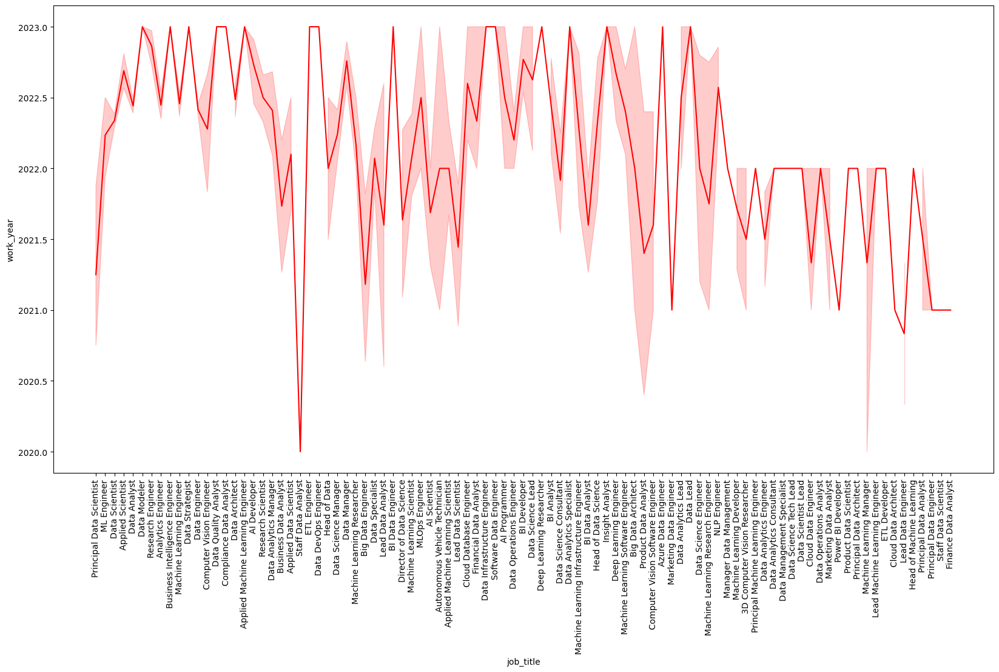

In [16]:

ax= sns.lineplot(y='work_year', 
                  x='job_title', 
                  color='red',
#                   hue='employment_type',
#                   dodge=True,
#                   markers=['o', 'x'],
#                   linestyles=['-','--'],
                  data=df)
plt.xticks(rotation='vertical')
plt.show()

## Which employment types was employed the most?

In [17]:
emp_type=df.employment_type.value_counts()
emp_type

employment_type
FT    3718
PT      17
CT      10
FL      10
Name: count, dtype: int64

Text(0.5, 1.0, 'NUMBER OF EMPLOYMENT TYPES EMPLOYED')

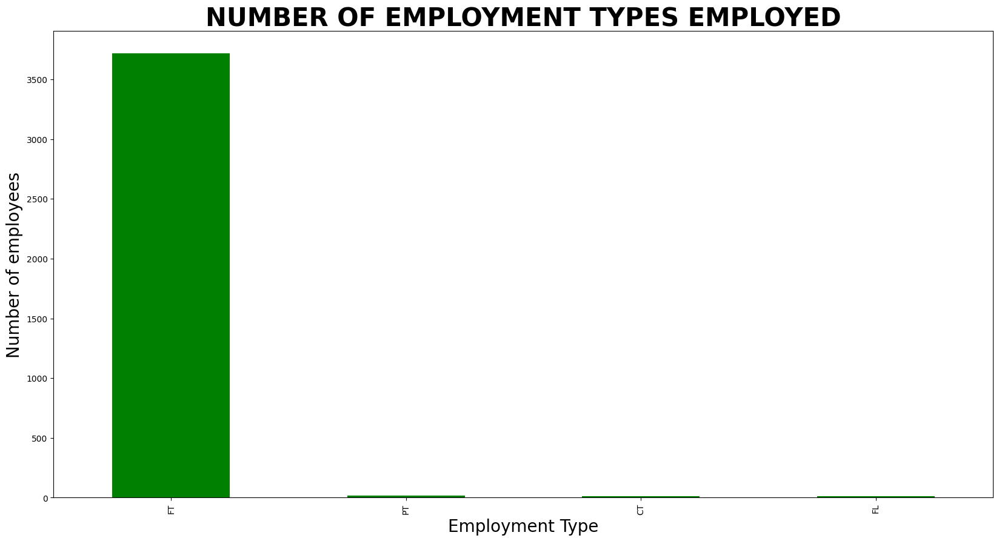

In [18]:
emp_type.plot(kind='bar', color='green')
plt.xlabel('Employment Type', fontsize=20)
plt.ylabel('Number of employees',fontsize=20)
plt.title('NUMBER OF EMPLOYMENT TYPES EMPLOYED', fontsize=30, fontweight='bold')

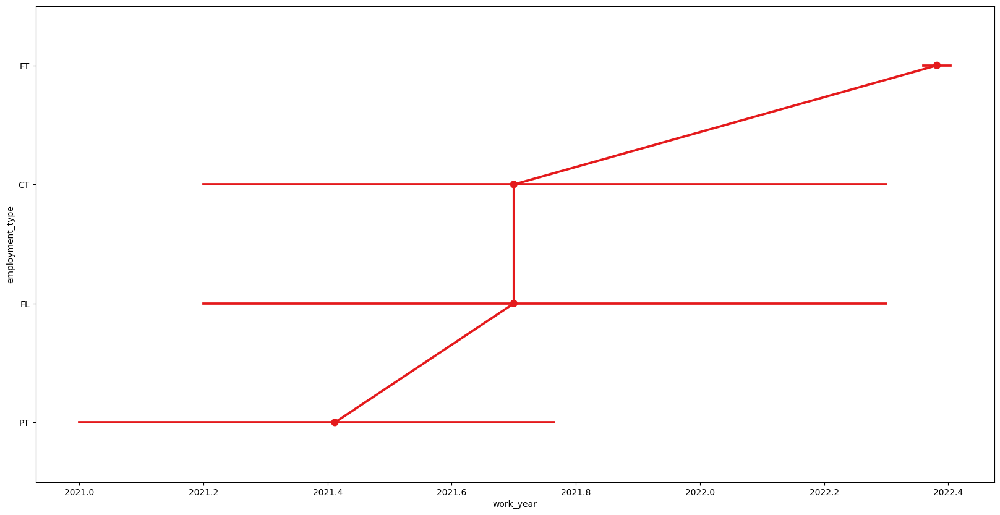

In [19]:
ax= sns.pointplot(x='work_year', y='employment_type', data=df)
plt.show()

## Which employment type get paid the most over the years?

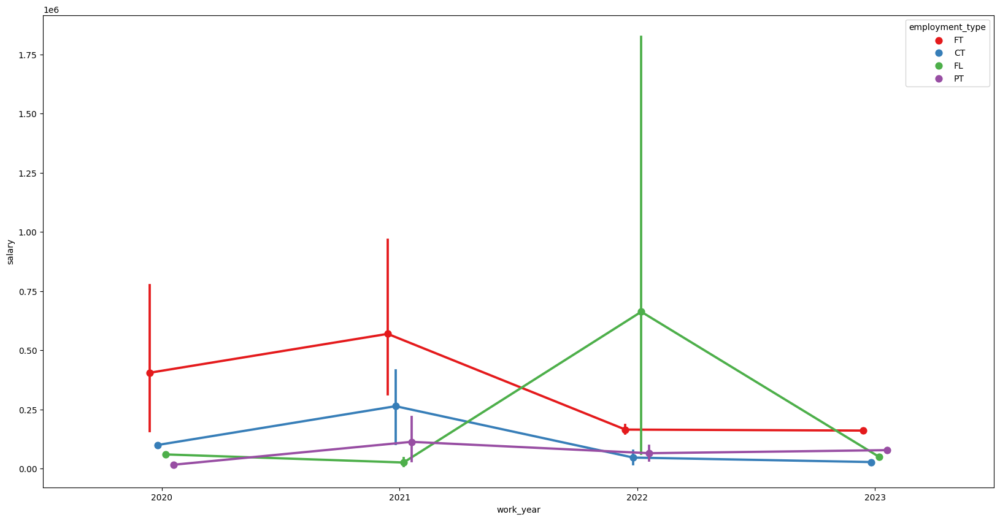

In [20]:
ax= sns.pointplot(x='work_year', 
                  y='salary', 
                  hue='employment_type',
                  dodge=True,
#                   markers=['o', 'x'],
#                   linestyles=['-','--'],
                  data=df)
plt.show()

## Which company size pay its workers the most over the years?

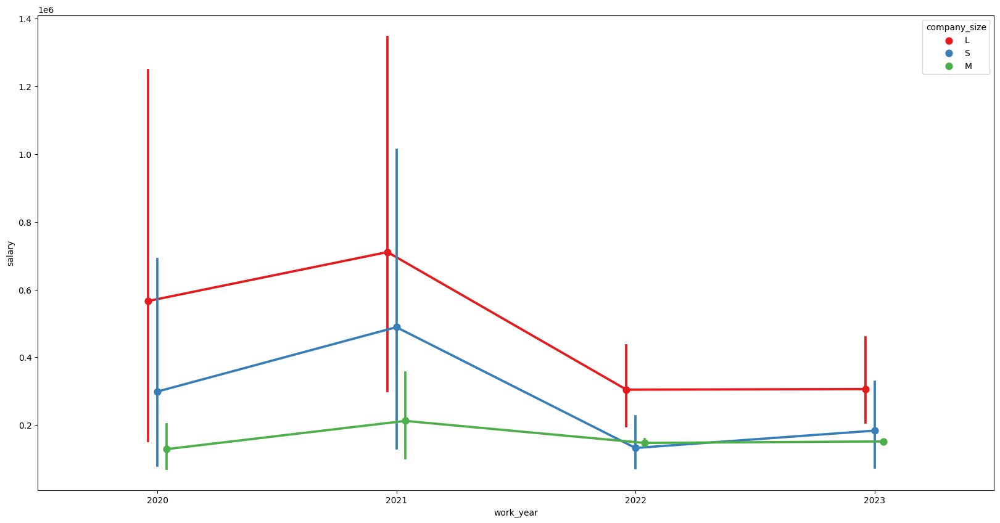

In [21]:
ax= sns.pointplot(x='work_year', 
                  y='salary', 
                  hue='company_size',
                  dodge=True,
#                   markers=['o', 'x'],
#                   linestyles=['-','--'],
                  data=df)
plt.show()

## What is the number of total companies in terms of company size?

In [22]:
com_size=df.company_size.value_counts()
com_size

company_size
M    3153
L     454
S     148
Name: count, dtype: int64

Text(0, 0.5, 'Number of Companies')

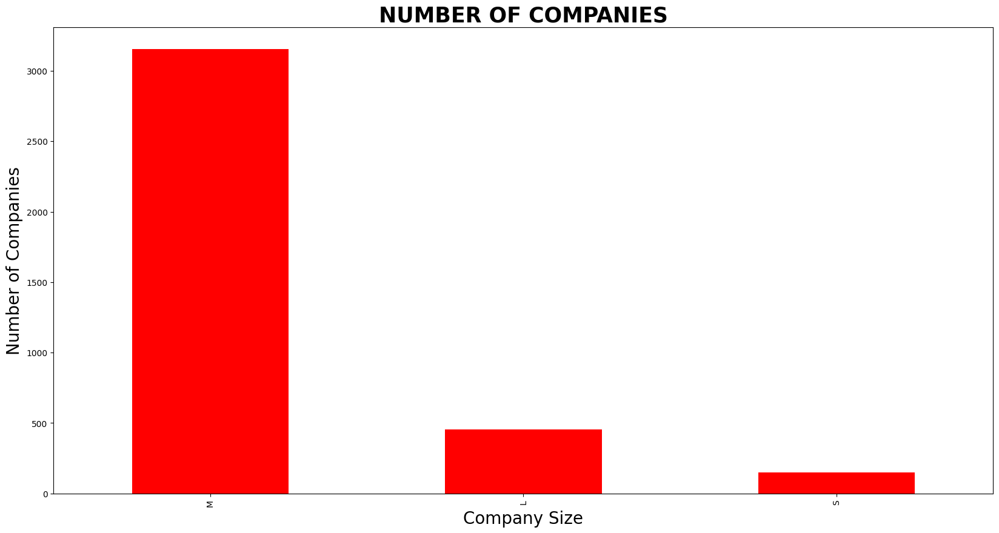

In [23]:
com_size.plot(kind='bar', color='red')
plt.title('NUMBER OF COMPANIES', fontsize=25, fontweight='bold')
plt.xlabel('Company Size', fontsize=20)
plt.ylabel('Number of Companies', fontsize=20)


## Which size of company employs the most over the years?

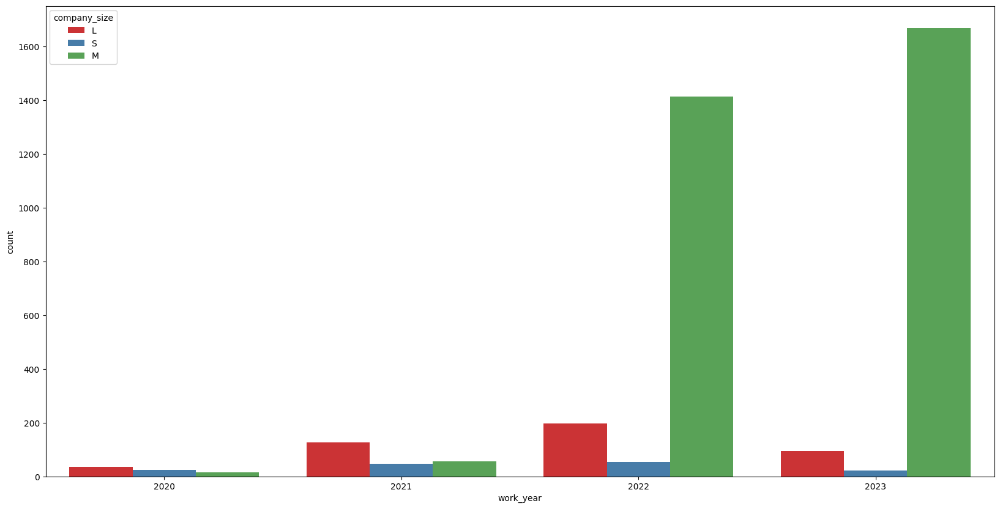

In [24]:
ax=sns.countplot(x='work_year', hue='company_size',data=df)
# color = ['black', 'yellow']
plt.show()

## Which location has the most paid salaries?

In [25]:
res=pd.DataFrame(df.groupby('employee_residence')['salary'].sum().sort_values(ascending=False).reset_index().head(10))
res

,employee_residence,salary
0,US,459077323
1,IN,119618997
2,CL,30505000
3,HU,28600000
4,JP,20492000
5,GB,12028139
6,CA,11924000
7,ES,4629060
8,DE,4177219
9,FR,2644620


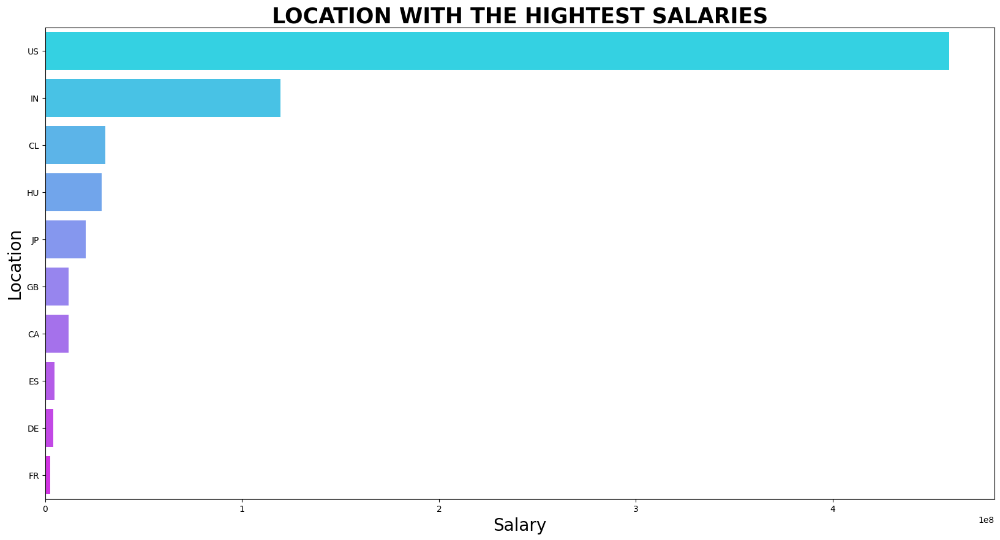

In [26]:
sns.barplot(x='salary', y='employee_residence', data=res, palette='cool')
plt.title('LOCATION WITH THE HIGHTEST SALARIES', fontsize=25, fontweight='bold')
plt.xlabel('Salary', fontsize=20)
plt.ylabel('Location', fontsize=20)

plt.show()

# HYPOTHESIS

## Salaries increase as the year passes by.

In [27]:
df.salary

0          80000
1          30000
2          25500
3         175000
4         120000
5         222200
6         136000
7         219000
8         141000
9         147100
10         90700
11        130000
12        100000
13        213660
14        130760
15        147100
16         90700
17        170000
18        150000
19        150000
20        110000
21        275000
22        174000
23        230000
24        143200
25        225000
26        156400
27        200000
28        130000
29         90000
30         72000
31        253200
32         90700
33        342810
34        184590
35        162500
36        130000
37        105380
38         64500
39        100000
40         30000
41       1650000
42        204620
43        110680
44        270703
45        221484
46        212750
47        185000
48        262000
49        245000
50        275300
51        183500
52        218500
53        199098
54        203300
55        123600
56        189110
57        139000
58        2587

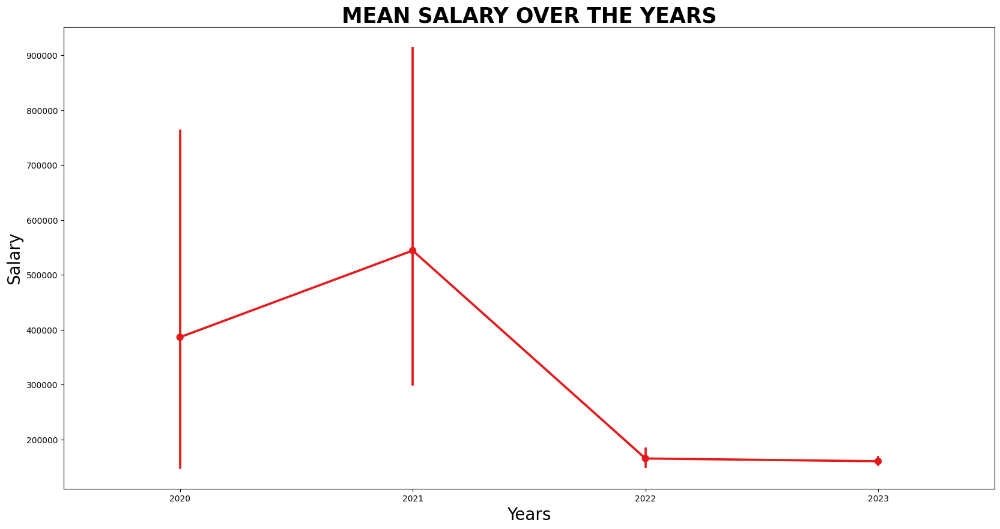

In [28]:
# Plotting salary changes over the years
ax=sns.pointplot(x='work_year', y='salary', data=df)
plt.title('MEAN SALARY OVER THE YEARS', fontsize=25, fontweight='bold')
plt.xlabel('Years', fontsize=20)
plt.ylabel('Salary', fontsize=20)
plt.show()

## Larger companies pay higer salaries

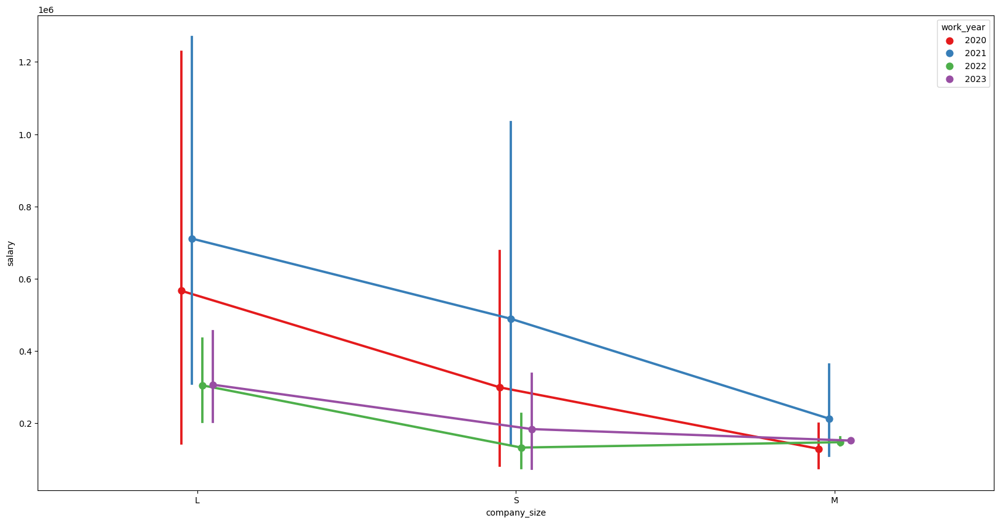

In [29]:



ax=sns.pointplot(x='company_size', 
                 y='salary', 
                 hue='work_year',
                 dodge=True,
#                   markers=['o', 'x'],
#                   linestyles=['-','--'],
                 data=df)
plt.show()

## The higher your experience level, the higher your salary.

Text(0.5, 1.0, 'SALARY PER EXPERIENCE LEVEL')

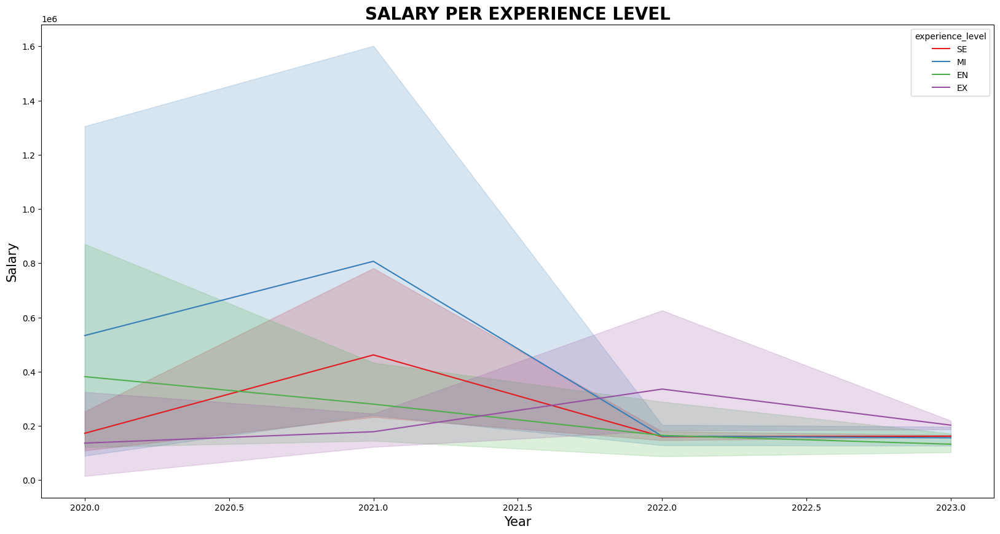

In [30]:
ax=sns.lineplot(y='salary', x='work_year', hue='experience_level', data=df)
plt.ylabel('Salary', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('SALARY PER EXPERIENCE LEVEL', fontsize=20, fontweight='bold')

## PREPARING DATA FOR MACHINE LEARNING

In [31]:
# Extracting categorical columns from the data set.
cat_cols = [col for col in df.columns if df[col].dtype == 'O']
cat_cols

['experience_level',
 'employment_type',
 'job_title',
 'employee_residence',
 'company_location',
 'company_size']

In [32]:
df

,work_year,experience_level,employment_type,job_title,salary,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,CA,100,CA,M
5,2023,SE,FT,Applied Scientist,222200,US,0,US,L
6,2023,SE,FT,Applied Scientist,136000,US,0,US,L
7,2023,SE,FT,Data Scientist,219000,CA,0,CA,M
8,2023,SE,FT,Data Scientist,141000,CA,0,CA,M
9,2023,SE,FT,Data Scientist,147100,US,0,US,M


### Econding Categorical Columns

In [33]:
from sklearn.preprocessing import OneHotEncoder

oh_encoder = OneHotEncoder(drop = "first", sparse = False)
oh_encoder.fit(df[cat_cols])
encoded_categoricals = oh_encoder.transform(df[cat_cols])
encoded_categoricals = pd.DataFrame(encoded_categoricals, columns = oh_encoder.get_feature_names_out().tolist())
encoded_categoricals

,experience_level_EX,experience_level_MI,experience_level_SE,employment_type_FL,employment_type_FT,employment_type_PT,job_title_AI Developer,job_title_AI Programmer,job_title_AI Scientist,job_title_Analytics Engineer,...,company_location_SG,company_location_SI,company_location_SK,company_location_TH,company_location_TR,company_location_UA,company_location_US,company_location_VN,company_size_M,company_size_S
0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [34]:
# Merging the encoded columns togather to have a unified data set
df_en = df.join(encoded_categoricals, on = df.index)
df_en.drop(columns = cat_cols, inplace = True)
df_en.rename(columns = lambda x: re.sub('[^A-Za-z0-9_]+', "", x), inplace = True)
df_en

,work_year,salary,remote_ratio,experience_level_EX,experience_level_MI,experience_level_SE,employment_type_FL,employment_type_FT,employment_type_PT,job_title_AIDeveloper,...,company_location_SG,company_location_SI,company_location_SK,company_location_TH,company_location_TR,company_location_UA,company_location_US,company_location_VN,company_size_M,company_size_S
0,2023,80000,100,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2023,30000,100,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,2023,25500,100,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,2023,175000,100,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2023,120000,100,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,2023,222200,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,2023,136000,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,2023,219000,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,2023,141000,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,2023,147100,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [35]:
df_en.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Columns: 251 entries, work_year to company_size_S
dtypes: float64(248), int64(3)
memory usage: 7.2 MB


## Scaling Numerical columns

In [36]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
num_cols =['remote_ratio']
df_en[num_cols] = scaler.fit_transform(df_en[num_cols])

df_en

,work_year,salary,remote_ratio,experience_level_EX,experience_level_MI,experience_level_SE,employment_type_FL,employment_type_FT,employment_type_PT,job_title_AIDeveloper,...,company_location_SG,company_location_SI,company_location_SK,company_location_TH,company_location_TR,company_location_UA,company_location_US,company_location_VN,company_size_M,company_size_S
0,2023,80000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2023,30000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,2023,25500,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,2023,175000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2023,120000,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,2023,222200,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,2023,136000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,2023,219000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,2023,141000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,2023,147100,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


## Splitting dataset

In [37]:
# Splitting data set into Train and Test 

Train = pd.DataFrame(df_en.iloc[:3001,:])
Test = pd.DataFrame(df_en.iloc[3001:,:])

Test=Test.reset_index()
Test.drop(['index'], axis=1 , inplace=True)

print(f'Number of rows and columns in the TRAIN dataset is {Train.shape} respectively')
print('---------------------------------------------------------------------------------')
print(f'Number of rows and columns in the TEST dataset is {Test.shape} respectively')


Number of rows and columns in the TRAIN dataset is (3001, 251) respectively
---------------------------------------------------------------------------------
Number of rows and columns in the TEST dataset is (754, 251) respectively


In [38]:
# Splitting dataset into 

X = Train.drop(columns = ['salary'])
y = Train['salary']

from sklearn.model_selection import train_test_split
X_train, X_eval, y_train, y_eval = train_test_split(X,y, test_size = 0.2, random_state = 27)


## Decision Tree

In [39]:
from sklearn.tree import DecisionTreeRegressor

# Creating an instance for the model.
Decision_tree_model = DecisionTreeRegressor(random_state=167)

# Training the model
Decision_tree_model.fit(X_train, y_train)



DecisionTreeRegressor(random_state=167)

In [40]:
y_pred = Decision_tree_model.predict(X_eval)

In [41]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error

y_pred = Decision_tree_model.predict(X_eval)

mar = mean_absolute_error(y_eval, y_pred)
mse = np.sqrt(mean_squared_error(y_eval, y_pred))
msle = mean_squared_log_error(y_eval, y_pred)
acc = Decision_tree_model.score(X_train, y_train)

results = pd.DataFrame([['Decision Tree', mar, mse, msle, acc]], columns = ['Model', 'Mean Absolute Error', 'Mean Squared Error', 'Mean Squared Log Error', 'Accuracy'])
results

# print(f'Mean absolute error is \n {mean_absolute_error(y_eval, y_pred)}')
# print('-------------------------------------------')
# print(f'Mean squared error is \n {np.sqrt(mean_squared_error(y_eval, y_pred))}')
# print('-------------------------------------------')
# print(f'Mean absolute log error is \n {mean_squared_log_error(y_eval, y_pred)}')

,Model,Mean Absolute Error,Mean Squared Error,Mean Squared Log Error,Accuracy
0,Decision Tree,58740.216204,290137.536257,0.306519,0.97138


## RandomForest

In [42]:
from sklearn.ensemble import RandomForestRegressor

# Creating an instance for the model.
Random_forest_model = RandomForestRegressor(random_state=167)

# Training the model
Random_forest_model.fit(X_train, y_train)

RandomForestRegressor(random_state=167)

In [43]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error

y_pred = Random_forest_model.predict(X_eval)

mar = mean_absolute_error(y_eval, y_pred)
mse = np.sqrt(mean_squared_error(y_eval, y_pred))
msle = mean_squared_log_error(y_eval, y_pred)
acc = Random_forest_model.score(X_train, y_train)

model_results = pd.DataFrame([['Random Forest', mar, mse, msle, acc]], columns = ['Model', 'Mean Absolute Error', 'Mean Squared Error', 'Mean Squared Log Error', 'Accuracy'])
results = results._append(model_results, ignore_index = True)
results


,Model,Mean Absolute Error,Mean Squared Error,Mean Squared Log Error,Accuracy
0,Decision Tree,58740.216204,290137.536257,0.306519,0.971380
1,Random Forest,57660.733564,288426.794871,0.229515,0.897038


In [44]:
from sklearn.linear_model import LinearRegression

# Creating an instance for the model.
LinearRegression_model = LinearRegression()

# Training the model
LinearRegression_model.fit(X_train, y_train)

LinearRegression()

In [45]:
y_pred = LinearRegression_model.predict(X_eval)

mar = mean_absolute_error(y_eval, y_pred)
mse = np.sqrt(mean_squared_error(y_eval, y_pred))
# msle = mean_squared_log_error(y_eval, y_pred)
acc = LinearRegression_model.score(X_train, y_train)

Model_results = pd.DataFrame([['Linear Regression', mar, mse,acc]], columns = ['Model', 'Mean Absolute Error', 'Mean Squared Error','Accuracy'])
results = results._append(model_results, ignore_index = True)
Model_results

,Model,Mean Absolute Error,Mean Squared Error,Accuracy
0,Linear Regression,4.901299e+15,3.347983e+16,0.699253


## Extracting Requirments

In [46]:
df1 = df.opy()
df1

AttributeError: 'DataFrame' object has no attribute 'opy'

In [ ]:
df1['job_tittle'] = df1['job_tittle'].str.strip()
# funding_2018['Industry'] = funding_2018['Industry'].str.split(',').str[0]

In [ ]:
# Exporting the requirments
requirements = "\n".join(f"{m.__name__}=={m.__version__}" for m in globals().values() if getattr(m, "__version__", None))

with open("requirements.txt", "w") as f:
    f.write(requirements)
requirements

## Exporting App elements

In [ ]:
# Creating a dictionary for objects
App_Tookit = {
    'encoder': oh_encoder,
    'scaler': scaler,
    'model': Decision_tree_model,
    'data':df,
}

# Exporting the dictionary using pickle
import pickle
with open('App_Toolkit.pkl', 'wb') as file:
    pickle.dump(app_tookit, file)

In [ ]:
# Test: Loading the ML items
with open('App_Toolkit.pkl', 'rb') as file:
    loaded_items = pickle.load(file)
    
loaded_items